# Fruit and Vegetable Image Classification

DATASCI 281 Summer 2022 Final Project

Anne Marshall, Robert Park, Shirley Jiang, Cynthia Zhu

# Contents

- [Introduction](#intro)
- Dataset
- Dataset Preprocessing
- Implementation
    - Step 1: Library import
    - Step 2: [Load & split data](#s2)
        - 2a: Mount google drive if needed
        - 2b: Split full data set in to train/test/val
    - Step 3: [Feature calculation](Step-3:-Feature-calculation)
        - 3a: Manual Feature Definition
            - 3a-1: Kmeans Major colors
            - 3a-2: Local Binary Pattern features
            - 3a-3: HOG Features
            - 3a-4: FFT features
        - 3b: Manual Feature EDA
        - 3c: Convert data to features
    - Step 4: [PCA/t-SNE for manual features](Step-4:-PCA/t-SNE-for-manual-features)
        - 4a: Normalize features
        - 4b: PCA calculation and visualization
        - 4c: t-SNE visualization
    - Step 5: Feature extraction from Pre-trained Model
        - 5a: t-SNE of PCA using ResNet features
    - Step 6: Model running and Evaluation utilities
    - Step 7: Kmeans training
        - 7a: Model Limitations
    - Step 8: K-Nearest Neighbors Classifer
        - 8a: Model Limitations
    - Step 9: SVM training
        - 9a: Model Limitations
    - Step 10: CNN training
        - 10a: CNN with PCA reduced hand-crafted features
        - 10b: CNN with PCA reduced hand-crafted features and ResNet extracted features
        - 10c: Model Limitations
    - Step 11: Check against test set
- Summary and Conclusions
- Appendix
        
    
    
    

<a id='intro'></a>
# Introduction
Our project aims to classify fruits and vegetables using handcrafted features–including color and texture quantified by Fast Fourier Transforms (FFT), Histogram of Gradients (HOG), and Local Binary Pattern (LBP) – and learned features from ResNet pretrained models. We classify the images using Kmeans, KNN, SVM, and CNN models. We compare performance between the models using combinations of our handcrafted and learned features. Our final results show that the best performing model was SVM using only the ResNet features.

# Dataset

The dataset comes from [Fruits and Vegetables Image Recognition Dataset](https://www.kaggle.com/datasets/kritikseth/fruit-and-vegetable-image-recognition) on Kaggle. The dataset contains 36 total labels. The original dataset was created by scraping Bing image search results. Due to the nature of the data collection, images were incredibly varied—some having outdoor backgrounds and some on white backgrounds, some with single or multiple pieces of the fruit or vegetable, and others being cartoonized, stylized, or a memeified version of the fruit or vegetable.


# Dataset Preprocessing

The original dataset also had other issues. For example, it did not have a true validation or test set. Despite having separate folders for validation and test for each label, there were images duplicated within each label. We wrote code to search for and remove the duplicate images. We then recreated the train-test-validation split.

On visual inspection of the images, we identified several redundancies of images across labels. For example *bell pepper* and *capsicum* were highly overlapping, as were *corn* and *sweet corn*. In addition, *paprika* was predominantly images of the ground spice, not its plant. To avoid downstream classification problems, we dropped the redundant categories. In addition, we dropped categories with largely low quality images. This culling was done before any models were run and was strictly based on visual inspection. For a detailed label count breakdown of the original and culled dataset, please see the Appendix. The categories which have been dropped are highlighted. Our final dataset includes 31 distinct categories.

Lastly, there was a wide range in resolution of the images. The vast majority were rectangles and on average more than 1200 pixels in both size and width. In order to standardize, we resized all the images to both 300x300 and 32x32 pixels. We chose multiple sizes in case we wanted to compare model performance downstream. We investigated cropping and padding images as an alternative, but ultimately decided on resizing since our manual checks showed we would not lose too much information by downsizing and the photos did not look too distorted after reshaping to a square. In addition, after resaving all the images, we would know all the images were of the same file type (.jpg) and therefore the CNN would perform as expected and not mistakenly distinguish by file type.

Please see the provided supplementary workbook for the preprocessing code.


# Implementation

## Step 1: Library import

In [1]:
!pip install ipython-autotime
%load_ext autotime


[notice] A new release of pip available: 22.1.2 -> 22.2.2
[notice] To update, run: python.exe -m pip install --upgrade pip
time: 0 ns (started: 2022-08-05 00:07:25 -07:00)


In [2]:
# general imports
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import os 
from PIL import Image

# training metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
import seaborn as sns

# training utilities
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

# feature management
from skimage import feature
from skimage.feature import hog
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from skimage import data, exposure

random.seed(281)

# resnet features
import torch 
import torchvision.models as models
from torch import nn
from torchsummary import summary
from torchvision import transforms
import warnings

# tensorflow
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPool2D, Flatten, Activation

# models
from sklearn import svm
from sklearn.cluster import KMeans
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier

# cutomized modules
from read_images import read_data
from visualize import display_random_images, display_features
from run_model import plot_confusion, display_failures, run_model_for_features


time: 18.6 s (started: 2022-08-05 00:07:25 -07:00)


<a id='s2'></a>
## Step 2: Load  & split data

In [3]:
#Constants

# add more categories here!
labels_used = ['apple','banana','beetroot','bell pepper','cabbage',
               'carrot','cauliflower','corn','cucumber','eggplant',
               'garlic','ginger','grapes','jalepeno','kiwi',
               'lemon','lettuce','mango','onion','orange','pear','peas',
               'pineapple','pomegranate','potato','raddish','soy beans',
               'spinach','tomato','turnip','watermelon']

print(f"Total categories used: {len(labels_used)}")
# are you running off of local data or drive?
file_source = "local"
#file_source = "google"

# these should total to 1!!!
train_pct = .8
test_pct = .1
val_pct = .1

Total categories used: 31
time: 16 ms (started: 2022-08-05 00:07:44 -07:00)


### 2a: Mount google drive if needed

In [4]:
if (file_source == "google"):
    # Note this import needs to be in here, since we don't use this outside of colab
    from google.colab import drive
    drive.mount('/content/drive')
    PATH = 'drive/MyDrive/281 Final Project/data'
    data_directory = PATH+"/resized_300x300"
else:
    data_directory = 'data/resized_300x300'

time: 0 ns (started: 2022-08-05 00:07:44 -07:00)


### 2b: Split full data set in to train/test/val
Original data set had duplication among groups.  So we have recombined all images and removed duplicates

Note: random_state set so that we have a consistent split from run to run.

In [6]:
def split_datasets(train_set_images, train_set_labels):
    # split training data sets from remainders
    # data set comes with "test" images but they are a duplication of the validation set

    # split out the training images
    train_images, test_val_images,train_labels, test_val_labels = train_test_split(
        train_set_images, train_set_labels, test_size=(test_pct+val_pct), 
        random_state=281,stratify=train_set_labels)
    
    print(f"Training set size: {len(train_images)}")
    # split test and validation
    test_images, val_images, test_labels, val_labels = train_test_split(
        test_val_images, test_val_labels, test_size = (test_pct/(test_pct+val_pct)),
        random_state = 281,stratify=test_val_labels)

    print(f"Test set size: {len(test_images)}")
    print(f"Validation set size: {len(val_images)}")
    return train_images, train_labels, test_images, test_labels, val_images, val_labels
    
        
images, labels, categories = read_data(data_directory, labels_used)
        
train_images, train_labels, test_images, test_labels, val_images, val_labels = split_datasets(images, labels)


Processing label: apple
Processing label: banana
Processing label: beetroot
Processing label: bell pepper
Processing label: cabbage
Processing label: carrot
Processing label: cauliflower
Processing label: corn
Processing label: cucumber
Processing label: eggplant
Processing label: garlic
Processing label: ginger
Processing label: grapes
Processing label: jalepeno
Processing label: kiwi
Processing label: lemon
Processing label: lettuce
Processing label: mango
Processing label: onion
Processing label: orange
Processing label: pear
Processing label: peas
Processing label: pineapple
Processing label: pomegranate
Processing label: potato
Processing label: raddish
Processing label: soy beans
Processing label: spinach
Processing label: tomato
Processing label: turnip
Processing label: watermelon
apple: 68
banana: 70
beetroot: 78
bell pepper: 85
cabbage: 82
carrot: 77
cauliflower: 75
corn: 81
cucumber: 86
eggplant: 78
garlic: 87
ginger: 65
grapes: 95
jalepeno: 85
kiwi: 84
lemon: 76
lettuce: 92

Below are random images from the dataset showing the diversity.

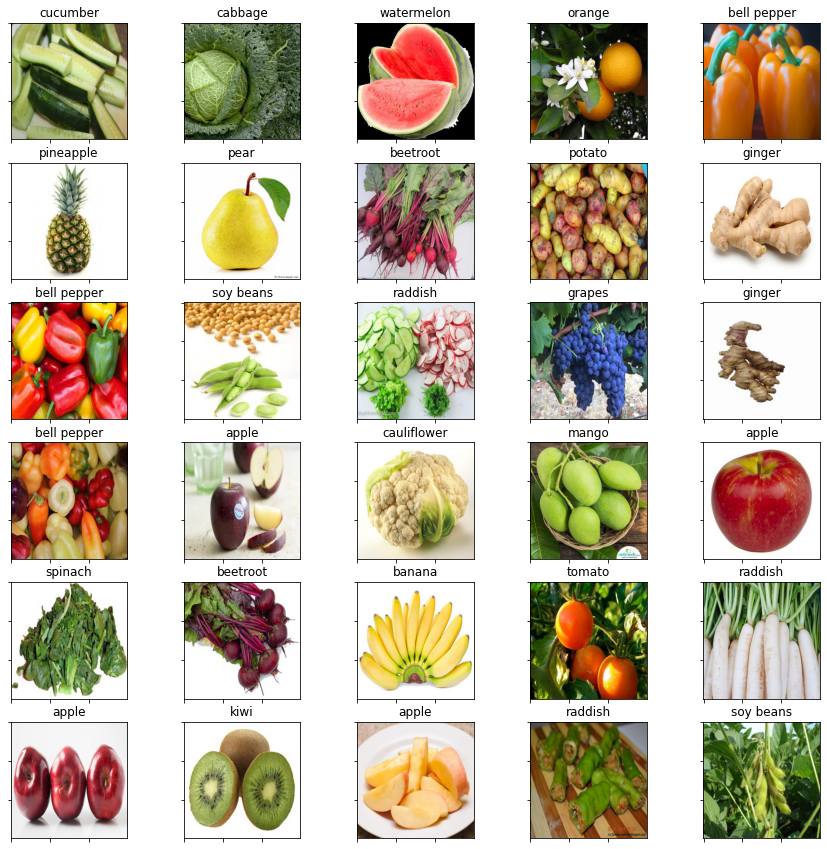

time: 1.8 s (started: 2022-08-05 00:07:51 -07:00)


In [7]:
# randomly choose images to display here       
display_random_images(train_images, train_labels)

## Step 3: Feature calculation

Our initial thoughts on what features would be significant for our dataset were those around color and texture.  We explored two ways of evaluating color (average and top colors) as well as three ways of modeling texture, Fast Fourier Transforms (FFT), Histogram of Gradients (HOG), and Local Binary Pattern (LBP).

### 3a: Manual Feature Definition

Below are three Apple examples that show the wide range in types of images found in the dataset, as explained below.

<Figure size 432x288 with 0 Axes>

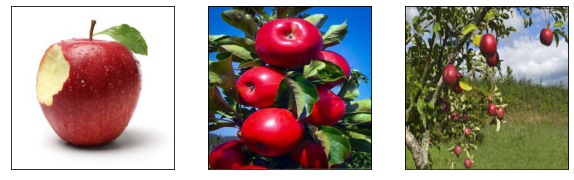

time: 172 ms (started: 2022-08-05 00:07:53 -07:00)


In [8]:
# Example Apple Images

Image1 = plt.imread(data_directory + '/apple/Image_1.jpg')
Image2 = plt.imread(data_directory + '/apple/Image_68.jpg')
Image3 = plt.imread(data_directory + '/apple/Image_54.jpg')

plt.figure()
plt.rcParams["figure.figsize"] = (10,3)

f, axarr = plt.subplots(1,3) 

for ax in axarr:
    ax.set_xticks([])
    ax.set_yticks([])

axarr[0].imshow(Image1)
axarr[1].imshow(Image2)
axarr[2].imshow(Image3)

#### 3a-1: Kmeans Major colors

We intuited that colors would be an important feature for distinguishing fruits and vegetables, for example, orange *carrots*, yellow *corn*, and yellow *bananas*. Since many images were the fruit or vegetable on a plain white background, the first naively crafted feature was extracting the average color of each image. It was quickly obvious that getting the average color did not generalize well for any image. An image with a red apple and a white background (like the first example above) would have a light red color average, but an image of apples in an apple tree would have a mixture of green leaves and red apples (like the third example above), resulting in a muddy brown color average. The background significantly impacted the average color, making the average color a poor indicator.

To extract more nuanced color information, we extracted color information by determining dominant colors through clustering using Kmeans from the OpenCV library. We tested using different numbers of clusters, and ultimately decided on 8 clusters because it captured the diverse colors within a complex image (like the second example above). Although using 3 clusters was more efficient, it was unable to capture the richness of the dataset. 

To further contextualize the dominant colors, we used color segmentation to capture the image silhouette and colors. Instead of color bars, the clustered colors in the image are in the shape of their original fruit and vegetable, background, foreground, and other large objects in the picture. Color segmentation removed details like texture and lighting in favor of shaped blobs of color corresponding to large shapes. The shortcoming of this method is that it assumes the subject fruit or vegetable is represented in a size large enough to appear as a cluster. An image with a large red apple on a white background would be easy to represent. Now, with segmentation, a large red apple with a patterned or varied background would appear easily. However, once again, an image of apples in an apple tree could lose out on the reds of the apples in the tree because they are too small. Image segmentation may catch the larger details of the tree’s leaves and trunk along with the sky and ground, but the small apples dotting the tree may get lost as they are not dominant pieces of the image. We show the Kmeans samples of both 3 and 8 clusters, as well as the average color, in the EDA section below.

In [9]:
# this list is referred to by code in later sections, and should contain all types of features we know
feature_names = ["Color Features","HOG Features","FFT Features","LBP Features","Resnet Features"]

time: 0 ns (started: 2022-08-05 00:07:53 -07:00)


In [10]:
def average_color_feature(img):
    # Example using one sample image (cont'd)
    avg_color = img.mean(axis=0).mean(axis=0)
    # A image that's just one color
    avg_color_img = np.ones_like(img, dtype=np.uint8) * np.uint8(avg_color)
    return (avg_color,avg_color_img)
    
def calculate_n_dominant_colors(img, n_colors=3):
    """
    Input: image/numpy array representation of image, optional input: number of colors for k-means
    """
    # Code source: https://stackoverflow.com/questions/43111029/how-to-find-the-average-colour-of-an-image-in-python-with-opencv

    # we apply k-means clustering to create a palette with the most representative colours of the image (in this toy example n_colors was set to 5).
    pixels = np.float32(img.reshape(-1, 3))

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, .1)
    flags = cv2.KMEANS_RANDOM_CENTERS

    _, labels, palette = cv2.kmeans(pixels, n_colors, None, criteria, 10, flags)
    _, counts = np.unique(labels, return_counts=True)

    # dominant color is the palette color which occurs most frequently on the quantized image
    dominant = palette[np.argmax(counts)]

    indices = np.argsort(counts)[::-1]   
    freqs = np.cumsum(np.hstack([[0], counts[indices]/float(counts.sum())]))
    rows = np.int_(img.shape[0]*freqs)

    dom_patch = np.zeros_like(img, dtype=np.uint8)
    for i in range(len(rows) - 1):
        dom_patch[rows[i]:rows[i + 1], :, :] += np.uint8(palette[indices[i]])
    
    return palette, dom_patch

time: 0 ns (started: 2022-08-05 00:07:53 -07:00)


In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def rp_kmeans_segmented(image,k):
    # reshape the image to a 2D array of pixels and 3 color values (RGB)
    pixel_values = image.reshape((-1, 3))
    # convert to float
    pixel_values = np.float32(pixel_values)

    # define stopping criteria
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

    # number of clusters (K)
    _, cluster_labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # convert back to 8 bit values
    centers = np.uint8(centers)

    # flatten the labels array
    cluster_labels = cluster_labels.flatten()

    # convert all pixels to the color of the centroids
    segmented_image = centers[cluster_labels.flatten()]

    # reshape back to the original image dimension
    segmented_image = segmented_image.reshape(image.shape)
    return(centers, segmented_image)

time: 31 ms (started: 2022-08-05 00:07:53 -07:00)


#### 3a-2: Local Binary Pattern features
Local Binary Pattern (LBP) is a texture operator which labels the pixels of an image by thresholding the neighborhood of each pixel and considers the result as a binary number. LBP texture descriptor uses the image in grayscale. For each pixel in the grayscale image, we select a neighborhood of size r surrounding the center pixel. A LBP value is calculated for this center picture and stored in the output 2D array with the same shape as the input image. We used the 2D array for display purposes and binned the 2D array in order to be used as image features for PCA calculation. The model tests did not show the LBP texture features were very informative and predictive, so they were dropped from our final feature model.

In [12]:
class LocalBinaryPatterns:
	def __init__(self, numPoints, radius):
		# store the number of points and radius
		self.numPoints = numPoints 
		self.radius = radius

	def describe(self, image, eps=1e-7):
		# compute the Local Binary Pattern representation
		# of the image, and then use the LBP representation
		# to build the histogram of patterns

		lbp = feature.local_binary_pattern(image, self.numPoints,
			self.radius, method="uniform")
		(hist, _) = np.histogram(lbp.ravel(),
			bins=np.arange(0, self.numPoints + 3),
			range=(0, self.numPoints + 2))
		# normalize the histogram
		hist = hist.astype("float")
		hist /= (hist.sum() + eps)
		# return the histogram of Local Binary Patterns
		return hist

def rgb2gray(rgb):
      R = rgb[:,:,0]
      G = rgb[:,:,1]
      B = rgb[:,:,2]
      return 0.2989 * R + 0.5870 * G + 0.1140* B 

def fft(im, axes=None):
  fft = np.fft.fftshift(np.fft.fft2(im))
  output = abs(np.fft.ifft2(fft))
  return output

def lbp_pattern_features(img):
  descriptor = LocalBinaryPatterns(24, 8)
  gray = rgb2gray(img)
  hist = descriptor.describe(gray)
  return(hist, hist)

def display_LBP(img):
	numPoints=24
	radius= 8
	gray = rgb2gray(img)
	lbp = feature.local_binary_pattern(gray, numPoints, radius, method="uniform")
	return (lbp, lbp)

time: 0 ns (started: 2022-08-05 00:07:53 -07:00)


#### 3a-3: HOG Features
We used a Histogram of Gradients filter to detect edge structures and textures. Gradients were calculated on cells of 50x50, and for 8 orientations, with 1x1 blocks of cells.  These parameters were chosen to generate a good sample of each area of the image, without going to too fine a focus. The model tests did not show the HOG features were very informative for differentiating our images, so they were dropped from our final feature model.


In [13]:
def calculate_HOG_features(img): 
    fd, hog_image = hog(img,orientations=8, pixels_per_cell=(50,50),
                    cells_per_block=(1, 1), visualize=True, multichannel=True)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 1))
    return(fd,hog_image_rescaled)

time: 0 ns (started: 2022-08-05 00:07:53 -07:00)


#### 3a-4: FFT features

We thought that the FFT representation of the image might be a way to capture textures that could differentiate between a smooth fruit like an apple, from something more textured like a slice of pomegranate. Similarly corn and carrots have many similarities but corn is characterized by a consistent structured period to the kernels, which shows up in FFT models.

Since the FFT analysis gives a large number of features over period length and angle we created a bucketed representation of the full space. We grouped the Fourier coefficients by length of the period and by angle. Frequency spaces were divided into 10 groups based on distance from the center, and 8 ranges in angle from 0 to 180 degrees. The buckets can be visualized similar to the top half of a dart board, and generate 80 discrete features. Examples are shown in the EDA section below.

In [14]:
n_rad_buckets = 10
n_ang_buckets = 8

def plt_dartboard(features,f_shape,radius_buckets,angle_buckets):
    # set up output image based on input image size
    ny,nx = f_shape[:2]
    xdim = nx
    ydim = int(ny/2)
    dart_plot = np.zeros((ydim,xdim))
    xcenter = int(xdim/2)
    ycenter = ydim
    
    # these need to match what we used in feature calculation, so use passed in parameters
    radius_interval = (xdim/2)/n_rad_buckets
    angle_interval = 180/n_ang_buckets
    
    # For everything in the top half of the space, used the feature value representing that 
    # part of the fft space
    # NOTE: this code should directly mimic the fft feature calculation, just inverted 
    # features -> image, rather than image-> feature
    for ix in range(xdim):
        for iy in range(ydim):
            radius = np.sqrt((ix-xcenter)**2 + (iy-ycenter)**2)
            angle = np.arctan2(iy-ycenter, ix-xcenter) * 180 / np.pi
            ind_r = int(radius/radius_interval)
            if (ind_r >= n_rad_buckets):
                ind_r = n_rad_buckets -1
            ind_a = int(angle/angle_interval)
            if (ind_a >= n_ang_buckets):
                ind_a = n_ang_buckets -1
            dart_plot[iy,ix] = features[ind_r,ind_a]
    return dart_plot

def calculate_fft_features(img):
    
    if (len(img.shape) >2 ):
    # squish into greyscale if it isn't already
        grey_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        grey_img = img
    
    [ydim, xdim] = grey_img.shape
    win = np.outer(np.hanning(ydim), np.hanning(xdim))
    win = win/np.mean(win)

    # fft param
    
    # fourier image
    F =  np.fft.fftshift(np.fft.fft2(grey_img*win))
    Fmag = np.abs(F)
    Fmag[Fmag < 0.01] = 0.01
    
    # bucketize magnitudes in a dart board pattern with set number radius buckets
    # and six buckets in angle

    radius_interval = (xdim/2)/n_rad_buckets
    n_ang_buckets = 8
    angle_interval = 180/n_ang_buckets
    
    features = np.zeros((n_rad_buckets,n_ang_buckets))
    count =  np.zeros((n_rad_buckets,n_ang_buckets))
    xcenter = int(xdim/2)
    ycenter = int(ydim/2)
    
    # NOTE: this code should be directly mimiced by the plot_dart function below, just inverted 
    # image-> features, rather than features -> image
    for ix in range(0,xdim):
        # note map ff2 field is semetric so only need to do half
        for iy in range(ycenter,ydim):
            
            radius = np.sqrt((ix-xcenter)**2 + (iy-ycenter)**2)
            angle = np.arctan2(iy-ycenter, ix-xcenter) * 180 / np.pi
            
            # corners are bigger, just put the m in the outer bucket since the windowing 
            # in the fft calculation has squashed them anyway
            ind_r = int(radius/radius_interval)
            if (ind_r >= n_rad_buckets):
                ind_r = n_rad_buckets -1
            ind_a = int(angle/angle_interval)
            if (ind_a >= n_ang_buckets):
                ind_a = n_ang_buckets -1
            
            #print(ix, ix-xcenter, iy, iy-ycenter, radius, ind_r, angle, ind_a)
            features[ind_r,ind_a] += np.log(Fmag[iy,ix])
            count[ind_r,ind_a] += 1
    
    for ir in range(n_rad_buckets):
        for ia in range(n_ang_buckets):
            if (count[ir,ia] > 0):
                features[ir,ia] = features[ir,ia]/count[ir,ia]
    dart_img =  plt_dartboard(features,img.shape,n_rad_buckets,n_ang_buckets)
    return(features.flatten(), dart_img,(np.log(Fmag)))

time: 16 ms (started: 2022-08-05 00:07:53 -07:00)


### 3b: Manual Feature EDA

In evaluating our features we looked at a random sample of images from the collection and applied each of our feature extraction methods to them for visualization. Below you can see some examples of this applied. While it was difficult to determine the utility of the texture functions this way, we were able to identify that using a k=3 value for the colors was too few colors. A color segmented image lost much distinct information, whereas using k=8 identified the core colors and preserved important characteristics.

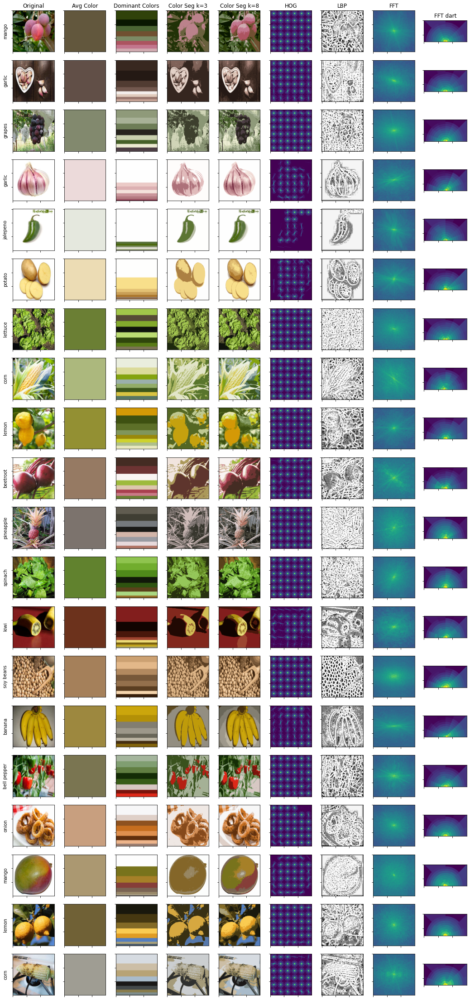

time: 1min 20s (started: 2022-08-05 00:07:53 -07:00)


In [15]:
# select a set of images to use for all
n_samples = 20
selected_images = np.random.randint(len(train_images), size=n_samples)
 
display_features(train_images,train_labels,1,selected_images)

### 3c: Convert data to features

In this section we do the transformation of images to features. We have only included the color and FFT feature sets, as they showed the most differentiability among our manually created feature types.

Some of the utilities used here are:
- get_feature_index: A helper function that returns the index of a given feature in our list of features.
- flatten_arr: A helper function that flattens our features set.
- build_input_feature_set: A helper function that builds the selected feature set for input to the model. It helps us run tests against a subset of our full feature set.

In [16]:
# All feature calculations  for model should be in this block

# in our modeling tests Color features and FFT did fairly well in classification, 
# but LBP and HOG did not.  We are continuing with only Color, FFT and resnet featuress
used_feature_names = ["Color Features","FFT Features","Resnet Features"]
use_HOG = False
use_LBP = False
use_FFT = True
use_color = True

def calculate_color_features(img): 
    palette,_ = calculate_n_dominant_colors(img, n_colors=8)
    avg_color, _ = average_color_feature(img)
    result = np.append(avg_color,palette).astype(np.uint8)
    return(result)
     
def calculate_features(image,verbose=False):
    features_set_list = []
    
    if (use_color):
        color_seg = calculate_color_features(image)
        features_set_list.append(color_seg)
        if verbose:
            print(color_seg.shape, " Color Features")
    
    if (use_HOG):
        hog_feat, _ = calculate_HOG_features(image)
        features_set_list.append(hog_feat)
        if verbose:
            print(hog_feat.shape, " HOG Features")
    
    if (use_FFT):
        fft_feat,_,_ = calculate_fft_features(image)
        features_set_list.append(fft_feat)
        if verbose:
            print(fft_feat.shape," FFT Features")
    
    if (use_LBP):
        lbp_feat, _ =  lbp_pattern_features(image)
        features_set_list.append(lbp_feat)
        if verbose:
            print(lbp_feat.shape," LBP Features")
        
    return(features_set_list)

feature_shapes = calculate_features(train_images[0],verbose=True)
len(feature_shapes)

# utilities for manipulating feature sets
def flatten_arr(features_set):
  output = []
  for sample in features_set:
    output.append(np.concatenate(sample).ravel())
  return output

def get_feature_index(feature_name,f_names= used_feature_names):
    for i, fn in enumerate(f_names):
        if feature_name == fn:
              return i
    return -1

def build_input_feature_set(feature_pca_set, embeddings,selected_features,verbose=False,super_verbose=False ):
    output_features = []
    for i_pca, feature_pcas in enumerate(feature_pca_set):
        features = []
        for isel, selected_feature in enumerate(selected_features):
            if selected_feature == "Resnet Features":
                # append the embeddings
                embeding_features = np.array(embeddings[i_pca])
                features.extend(embeding_features)
            else:
                f_index = get_feature_index(selected_feature,used_feature_names)
                if (f_index >= 0):
                    if super_verbose:
                        print(f_index,len(feature_pcas[f_index]),len(features))
                    features.extend(feature_pcas[f_index])
                    if super_verbose: 
                        print(len(features))
        
        output_features.append(features)
        if verbose:
            print(len(output_features),len(features))
    if verbose:
        print(f"{len(output_features)} rows processed")
    return(output_features)

(27,)  Color Features
(80,)  FFT Features
time: 1.58 s (started: 2022-08-05 00:09:14 -07:00)


In [17]:
# convert each image set to features
train_features = []
for img in train_images:
    img_features =  calculate_features(img)
    train_features.append(img_features)

time: 58min 18s (started: 2022-08-05 00:09:15 -07:00)


In [18]:
test_features = []
for img in test_images:
    img_features =  calculate_features(img)
    test_features.append(img_features)

time: 6min 21s (started: 2022-08-05 01:07:34 -07:00)


In [19]:
val_features = []
for i,img in enumerate(val_images):
    img_features =  calculate_features(img)
    val_features.append(img_features)

time: 6min 17s (started: 2022-08-05 01:13:55 -07:00)


## Step 4: PCA/t-SNE for manual features

We used PCA on our manually created features, to concentrate the representation from our features in as few as possible while still representing the diversity of our data well. We looked at the contribution for each of the resultant features, and took as many as captured 95% of the variability of the data. For the color features that resulted in the 27 color features being reduced to 15, and the 80 FFT features were reduced to 7.

We did a t-SNE visualization of our manual feature data both before and after PCA reduction. At first, applied t-SNE on color and FFT features separately. We experimented with different combinations of perplexity and learning rate for t-SNE, with perplexity numbers from 5 to 100, and learning rate ranging from 100 to 800. However, for the raw and PCA versions of the color and FFT features, they failed to show any separability. 

After seeing clustering occur in Kmeans and KNN, however, t-SNE’s inability to find any clustering no longer made sense. To remedy this, we attempted data normalization through zero means and unit standard deviation and performing t-SNE on different combinations of manual and learned image features.

PCA and t-SNE do not automatically normalize (zero mean and unit standard deviation) the data, so we built a function to accomplish this.

We learned that learning rate is not a very useful parameter, as large values may skip optimal clusters. As for perplexity, “[it] is related to the number of nearest neighbors that is used in other manifold learning algorithms. Larger datasets usually require a larger perplexity. Consider selecting a value between 5 and 50. Different values can result in significantly different results.” [[Source]](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) This time, we looked at a range of perplexity values from 50 to 200, as we had around 70 to 100 images per image category. We also set the learning rate to 0.01 and 5 to test for small changes in clustering. This updated approach to t-SNE was applied to different combinations of features: only manual features (color and FFT), only learned features (ResNet), and all features (manual and learned). As a result, we found clustering. Using the combination of image features is a better representation of the data passed into our models, so the clustering seen in the Kmeans and KNN models is finally represented in our t-SNE visualizations.

#### 4a: Normalize features
PCA and t-SNE do not automatically normalize (zero mean and unit standard deviation) data.

In [20]:
# this method does normalization for a set of features based on the min/max numbers calculated previously
# its used to apply the  normalization calcuated on the training set to the test/validation sets
def apply_normalization(raw_features,feature_mins_list, feature_maxs_list):
    n_samples = len(raw_features)
    n_feature_types = len(raw_features[0])
    
    output_features = []
    for i in range(n_samples):
        output_features.append([])
    for ift in range(n_feature_types):
        feature_mins = np.array(feature_mins_list[ift])
        feature_maxs = np.array(feature_maxs_list[ift])
        scale = (feature_maxs- feature_mins)
        for i in range(n_samples):  # iterate over rows
            output_feature_val = (np.array(raw_features[i][ift]) - feature_mins)/scale
            output_features[i].append(output_feature_val.tolist())
    return(output_features)


# this function normalizes a data set, and calculates the min/max values for each feature
def normalize(raw_features):
    output_feature_max = []
    output_feature_min = []
    n_samples = len(raw_features)
    n_feature_types = len(raw_features[0])
    
    output_features = []
    for i in range(n_samples):
        output_features.append([])
    for ift in range(n_feature_types):
        feature_size = len(raw_features[0][ift])
        feature_vals = np.zeros((n_samples,feature_size))
        # make a collection of all of the features across images, for this feature type
        for i in range(n_samples):
            feature_vals[i,:] = (raw_features[i][ift])
        
        feature_mins = np.min(feature_vals,axis=0)
        output_feature_min.append(feature_mins.tolist())
        
        feature_maxs = np.max(feature_vals,axis=0)
        output_feature_max.append(feature_maxs.tolist())
        
        for i in range(n_samples):  # iterate over rows
            output_feature_val = (feature_vals[i] - feature_mins)/(feature_maxs- feature_mins)
            output_features[i].append(output_feature_val.tolist())
    return(output_features, output_feature_min, output_feature_max)
                               
            

time: 0 ns (started: 2022-08-05 01:20:13 -07:00)


In [21]:
# run normalization
train_normalized,train_mins,train_maxs = normalize(train_features)
test_normalized = apply_normalization(test_features,train_mins,train_maxs)
val_normalized = apply_normalization(val_features,train_mins,train_maxs)

time: 15 ms (started: 2022-08-05 01:20:13 -07:00)


#### 4b: PCA calculation and visualization

In [22]:
def get_pca_values(raw_features,n_comp=None):
    pca_list = []
    pca_comp_count = []
    # keep track of what the maximum component number of all the feature sets is, 
    # so we can plot appropriately
    max_components = 0

    n_feature_types = len(raw_features[0])
    for ift in range(n_feature_types):
        feature_vals = []
        # make a collection of all of the features across images, for this feature type
        for i in range(len(raw_features)):
            feature_vals.append(raw_features[i][ift])
            if i == 0:
                feature_size = len(raw_features[i][ift])
        # has to be smaller than our smallest feature size
        if n_comp == None:
            n_components =min(feature_size,len(train_features))
        else:
            n_components = n_comp[ift]
        if n_components > max_components:
            max_components = n_components
        print(f"{used_feature_names[ift]}: {n_components}")
        
        pca = PCA(n_components=n_components, svd_solver="randomized", whiten=True).fit(feature_vals)
        pca_list.append(pca)
        
        # if component cutoffs were not passed in, calculate them here
        if (n_comp == None):
            cs = np.cumsum(pca_list[ift].explained_variance_ratio_)
            thresh = np.max([np.min(np.nonzero(cs>.95)),2]) # minimum two parameters
            print(f"{used_feature_names[ift]} pca threshold: {thresh}")
            pca_comp_count.append(thresh)
       
    
    return(pca_list,pca_comp_count,max_components)

def plot_pca(pca_list,max_components,comp_cutoffs):
    plt.figure(figsize=(15,5))
    colors = ['b-', 'g-','r-','m-']
    cutoff_colors =  ['b:', 'g:','r:','m:']
    for ift in range(len(pca_list)):
       plt.plot(np.cumsum(pca_list[ift].explained_variance_ratio_), colors[ift], label=used_feature_names[ift])
       plt.plot([comp_cutoffs[ift],comp_cutoffs[ift]],  [0,1], cutoff_colors[ift],label=f"{used_feature_names[ift]} component cutoff")
       
    plt.plot([0,max_components],[.95,.95],"k:",label="95% contribution threshold")    
    plt.xticks(np.linspace(1,max_components,15))
    plt.yticks(np.linspace(0, 1, 8))
    plt.grid(b=True)
    plt.xlabel('Number of components')
    plt.ylabel('Explained Variances')
    plt.legend()
    plt.show()

time: 0 ns (started: 2022-08-05 01:20:13 -07:00)


Calculate PCA transform based on all the data in the training set.  We calculate it one time without limits, then after plotting, and manually setting desired number PCA components per feature set, we recalculate to that limit.

In [23]:
pca_list, comp_cutoffs, max_comp = get_pca_values(train_normalized)

Color Features: 27
Color Features pca threshold: 15
FFT Features: 80
FFT Features pca threshold: 7
time: 47 ms (started: 2022-08-05 01:20:13 -07:00)


2


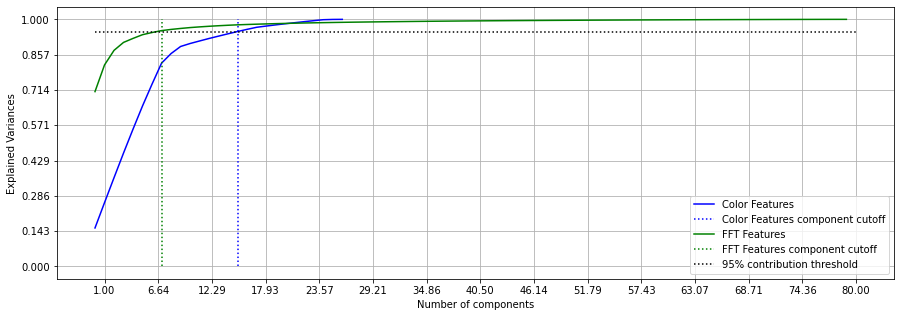

time: 172 ms (started: 2022-08-05 01:20:13 -07:00)


In [24]:
print(len(pca_list))
plot_pca(pca_list, max_comp, comp_cutoffs)

Color Features: 15
FFT Features: 7


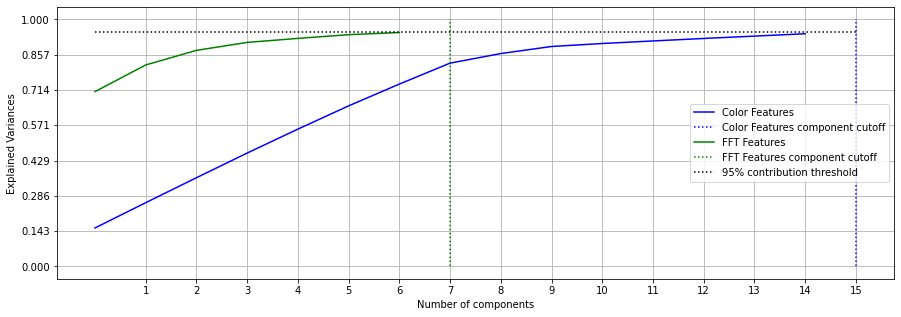

time: 188 ms (started: 2022-08-05 01:20:13 -07:00)


In [25]:
# rerun the PCA with the component cutoffs specified
# cutoffs are determined in the first pass by the point where 95% is attributed for

pca_list, _, max_comp = get_pca_values(train_normalized,comp_cutoffs)

plot_pca(pca_list, max_comp,comp_cutoffs)

Apply PCA transforms to all data sets.

Output feature vectors will be a consolidated into a vector of features in later stages.

In [26]:
def apply_pca_transform(pca_list,features_list):
    output_features = []
    # for each image
    for i in range(len(features_list)):
        transformed_features = []
        for ift in range(len(pca_list)):
            transformed = pca_list[ift].transform(np.array(features_list[i][ift]).reshape(1, -1))
            transformed_features.append(transformed[0])
        output_features.append(transformed_features)
    return(output_features)

time: 0 ns (started: 2022-08-05 01:20:13 -07:00)


In [27]:
train_pca = apply_pca_transform(pca_list,train_normalized)
test_pca = apply_pca_transform(pca_list,test_normalized)
val_pca = apply_pca_transform(pca_list,val_normalized)

time: 203 ms (started: 2022-08-05 01:20:13 -07:00)


##### 4c: t-SNE visualization
The following visualization failed to generate clustering patterns despite the trends displayed by the data because color features and FFT features alone did not make the categories separable. We needed to get combinations of features to get clustering.

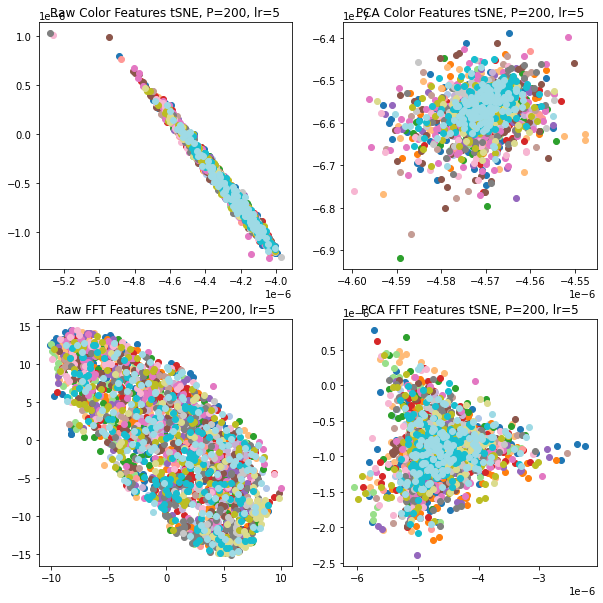

time: 56.9 s (started: 2022-08-05 01:20:13 -07:00)


In [28]:
def get_tsne(raw_features, n_components=2,perplex=30,lr=200):
    tsne_list = []
    n_feature_types = len(raw_features[0])
    for ift in range(n_feature_types):
         feature_vals = []
         # make a collection of all of the features across images, for this feature type
         for i in range(len(raw_features)):
            feature_vals.append(raw_features[i][ift])
            if i == 0:
                feature_size = len(raw_features[i][ift])
        
         tsne = TSNE(n_components=n_components, random_state=0,
                     perplexity=perplex, learning_rate=lr)
         X_tsne = tsne.fit_transform(feature_vals)
         tsne_list.append(X_tsne)
    return tsne_list

def plot_classes(X, y, ax, title):

  # color code each cluster 
  colormap = plt.cm.tab20
  colorst = [colormap(i) for i in np.linspace(0, 1.0, len(np.unique(y)))]
  # project the features into 2 dimensions
  for k in range(len(np.unique(y))):
    yset = (np.array(y) == k)
    ax.scatter(X[yset, 0], X[yset, 1],  facecolors=colorst[k])

  ax.set_title(title)

perplexity = 200
learning_rate = 5

tsne_raw_features = get_tsne(train_features,perplex=perplexity,lr=learning_rate)
normalized_features,_,_ = normalize(train_features)
tsne_normalized_features = get_tsne(normalized_features,perplex=perplexity,lr=learning_rate)

tsne_pca_features = get_tsne(train_pca,perplex=perplexity,lr=learning_rate)

# project the features into 2 dimensions
fig, ax = plt.subplots(nrows=len(used_feature_names)-1, ncols=2, figsize=(10,10))

for ift, feature_type in enumerate(used_feature_names[:-1]):
# y is the class labels
    plot_classes(tsne_raw_features[ift], train_labels, ax[ift,0], title=f'Raw {feature_type} tSNE, P={perplexity}, lr={learning_rate}')
    plot_classes(tsne_pca_features[ift], train_labels, ax[ift,1], title=f'PCA {feature_type} tSNE, P={perplexity}, lr={learning_rate}')
plt.show()

## Step 5: Feature extraction from Pre-trained Model

ResNet101 is a CNN model that has 101 layers deep and pretrained on more than a million images from the ImageNet Database for an image recognition task. We extracted weights of the second last layer of the ResNet101 model for each image and used it as feature embedding. This is a learned feature as it was obtained from a large pretrained model. This feature embedding has very strong predictive power in our modeling process in both SVM and CNN classifiers. 

In [29]:
warnings.filterwarnings('ignore')

time: 0 ns (started: 2022-08-05 01:21:10 -07:00)


In [30]:
class ResNet101(nn.Module):

    def __init__(self):
        super(ResNet101, self).__init__()
        
        # load the pretrained model
        self.model = models.resnet50(pretrained=True)
        # summary(self.model, input_size=(3,224,224))

        # select till the last layer
        # Dropping output layer (the ImageNet classifier)
        self.model = nn.Sequential(*list(self.model.children())[:-1])

    def forward(self, x):
      x = self.model(x)
      return x
    
# load the model
model_conv_features = ResNet101()

model_conv_features.eval()

ResNet101(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 

time: 485 ms (started: 2022-08-05 01:21:10 -07:00)


In [32]:
def extract_em(im_lst, model):
  em_output = []
  for im in im_lst:
    f_im = read_image(im)
    with torch.no_grad():
      em_output.append(model(f_im.unsqueeze(0).to('cpu')).squeeze().tolist())
  return em_output

time: 0 ns (started: 2022-08-05 01:21:11 -07:00)


In [33]:
def add_em_to_pca(em, pca):
  features = []
  for i in range(len(pca)):
    em_i = em[i]
    pca_i = pca[i]
    feature=pca_i.copy()
    feature.append(np.array(em_i))
    features.append(feature)
  return features

time: 0 ns (started: 2022-08-05 01:21:11 -07:00)


In [34]:
train_embeddings = extract_em(train_images, model_conv_features)
test_embeddings = extract_em(test_images, model_conv_features)
validation_embeddings = extract_em(val_images, model_conv_features)

time: 8min 26s (started: 2022-08-05 01:21:11 -07:00)


In [35]:
train_ft = add_em_to_pca(train_embeddings, train_pca)
test_ft = add_em_to_pca(test_embeddings, test_pca)
val_ft = add_em_to_pca(validation_embeddings, val_pca)

time: 313 ms (started: 2022-08-05 01:29:37 -07:00)


### 5a: t-SNE of PCA using ResNet features
After running initial Kmeans models and finding unsupervised patterns in the data, our previous t-SNE visualizations no longer seemed trustworthy. After exploring different perplexity values and learning rates as well as adding data normalization, we realized that the t-SNE visualization needed more image feature combinations (color, FFT, ResNet) to get the separation that the Kmeans model had. Color features alone and FFT features alone were not sufficient to create category separability. The results of adding combinations of PCA reduced features, both manual (color and FFT) + learned (ResNet) and ResNet alone, generated the best t-SNE visualizations as seen below.

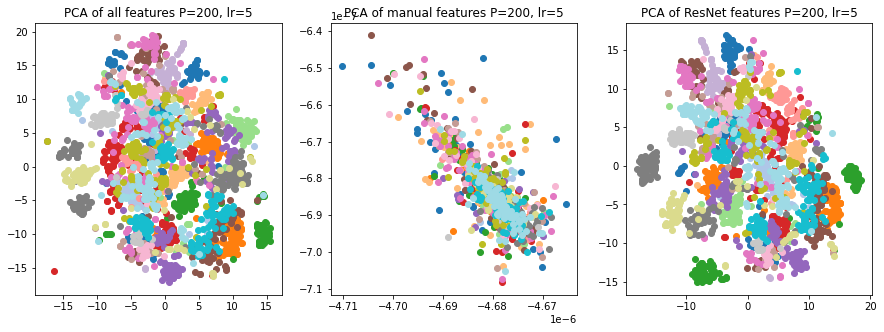

time: 45.3 s (started: 2022-08-05 10:15:36 -07:00)


In [37]:
feature_list = used_feature_names

train_pca_all_input = build_input_feature_set(train_pca, train_embeddings, feature_list)
train_pca_manual_input = build_input_feature_set(train_pca, train_embeddings, feature_list[:-1])
train_pca_resnet_input = build_input_feature_set(train_pca, train_embeddings, [feature_list[-1]])

tsne = TSNE(n_components=2, random_state=0, perplexity=perplexity, learning_rate=learning_rate)
tsne_pca_all = tsne.fit_transform(train_pca_all_input)
tsne_pca_manual = tsne.fit_transform(train_pca_manual_input)
tsne_pca_resnet = tsne.fit_transform(train_pca_resnet_input)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,5))
plot_classes(tsne_pca_all, train_labels, ax[0], title=f'tSNE + PCA of all features P={perplexity}, lr={learning_rate}')
plot_classes(tsne_pca_manual, train_labels, ax[1], title=f'tSNE + PCA of manual features P={perplexity}, lr={learning_rate}') 
plot_classes(tsne_pca_resnet, train_labels, ax[2], title=f'tSNE + PCA of ResNet features P={perplexity}, lr={learning_rate}') 

## Step 6: Model running and Evaluation utilities

We created utilities that help in post classification analysis and general helper functions. Below are descriptions of each of the functions:

- plot_confusion: A plotting function outputs the confusion matrix, which helps to visualize the predicted classifications against the actual classifications. The matrix is especially useful in understanding where the model has a pattern in misclassifications.
- display_features: A plotting function outputs the misclassified images. The images help give us a better understanding of why the model might be having trouble with certain images.

- run_model_for_features: A wrapper function that uses the selected feature set and the selected model and outputs metrics on the performance of the model. There is also a grid search option that returns the best model score and the corresponding parameters



In [38]:
# track best performing model
best_model = None
best_f1 = 0
best_features_to_use = used_feature_names
best_model_name = "No good models!"

time: 0 ns (started: 2022-08-05 10:17:36 -07:00)


## Step 7: Kmeans training

We used the Kmeans model to determine if clustering is occurring within our feature set. The number of clusters was set to the number of labels.

As shown in the confusion matrix below, the data points tend to be more grouped together vs. more distributed across the columns. 17 of the 31 actual labels (rows) have clusters of 5 or more data points in a given bucket (columns) compared to an average of 8 validation data points per label. This signals that Kmeans is finding patterns across the feature set. Note that we removed the x axis labels from the plot since Kmeans randomly assigns the predicted labels.

Below are the default Kmeans values used in the base model:

- init='k-means++', 
- n_init=10, 
- max_iter=300, 
- tol=0.0001, 
- verbose=0, 
- random_state=None, 
- copy_x=True, 
- algorithm='lloyd'


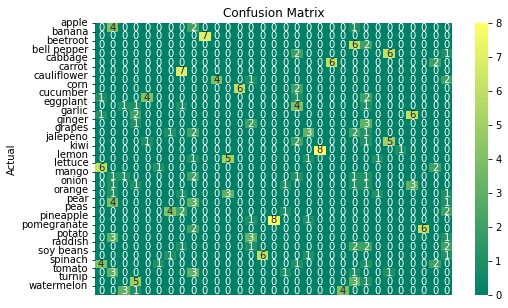

time: 7.34 s (started: 2022-08-05 10:17:40 -07:00)


In [39]:
# All Features including resnet
feature_list = used_feature_names

base_model = KMeans(n_clusters=len(labels_used))
acc,f1,val_pred = run_model_for_features(base_model, "Base Kmeans",feature_list=feature_list)

if f1 > .33:
    display_failures(val_images,val_labels,val_pred )

if (f1 > best_f1):
    best_f1 = f1
    best_model = base_model
    best_features_to_use = feature_list
    best_model_name = "Base Kmeans"

We also show the confusion matrices for the Kmeans base model against different feature sets.

 Processing feature Color Features


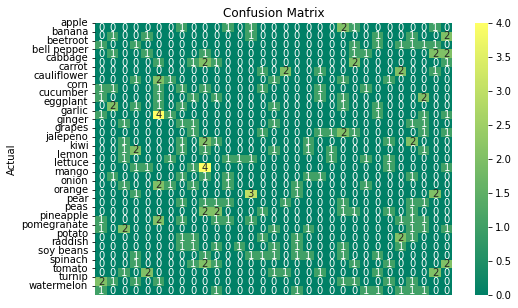

 Processing feature FFT Features


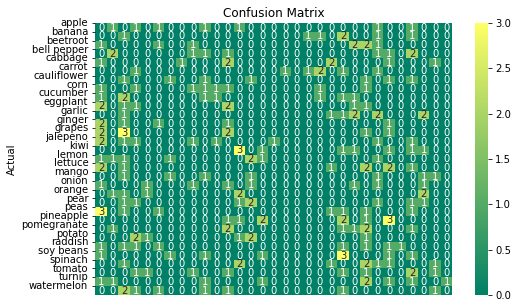

 Processing feature Resnet Features


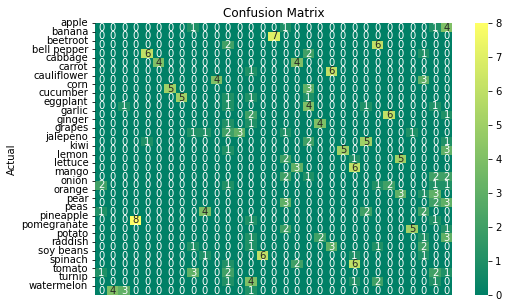

time: 11.3 s (started: 2022-08-05 10:17:48 -07:00)


In [40]:
# iterate over all feature except resnet

for f in used_feature_names:
    print (f" Processing feature {f}")
    base_model =KMeans(n_clusters=len(labels_used))
    acc,f1,val_pred = run_model_for_features(base_model, f"Base Kmeans only {f}",feature_list=[f])

    if f1 > .5:
        display_failures(val_images,val_labels,val_pred )
    if (f1 > best_f1):
        best_f1 = f1
        best_model = base_model
        best_features_to_use = [f]
        best_model_name = f"Base Kmeans only {f}"

### 7a: Model Limitations

Kmeans is relatively less useful for our purposes, since the unsupervised learning approach does not classify the clusters.

## Step 8: K-Nearest Neighbors Classifer

To get more meaningful metrics for applying a clustering algorithm to our PCA image data, we use K Nearest Neighbors (KNN). Where KMeans is unsupervised and the cluster values are assigned arbitrarily, KNN is supervised, allowing us to pass in designated cluster labels and evaluate the model for accuracy and F1 scores.

To define K, we simply used the number of labels in data. For all features (handmade and ResNet), it performs fairly well with an accuracy of 81.746% and an F1 score of 82.251. There is enough separability in our handmade features to define the fruit and vegetable clusters. With the help of ResNet, the misclassifications seem reasonable. Color features only perform better than random choice, but not exceptionally well with an accuracy of 11.508% and F1 score of 13.359. FFTs are slightly better with an accuracy of 17.46% and an F1 score of 19.935. ResNet only does slightly worse than the manual feature and ResNet combination with an accuracy of 79.762% and a F1 score of 80.215.

Base All Feature KNN validation set accuracy score:    81.746
Base All Feature KNN validation set f1 score:    82.251


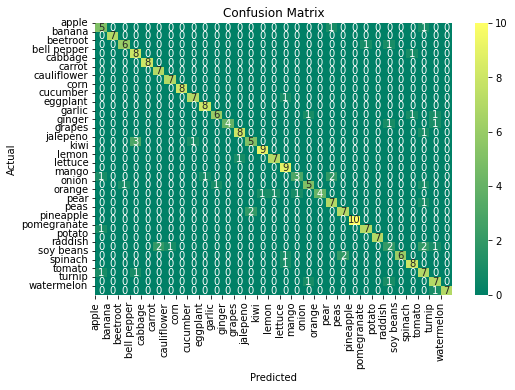

46 images were misclassifed


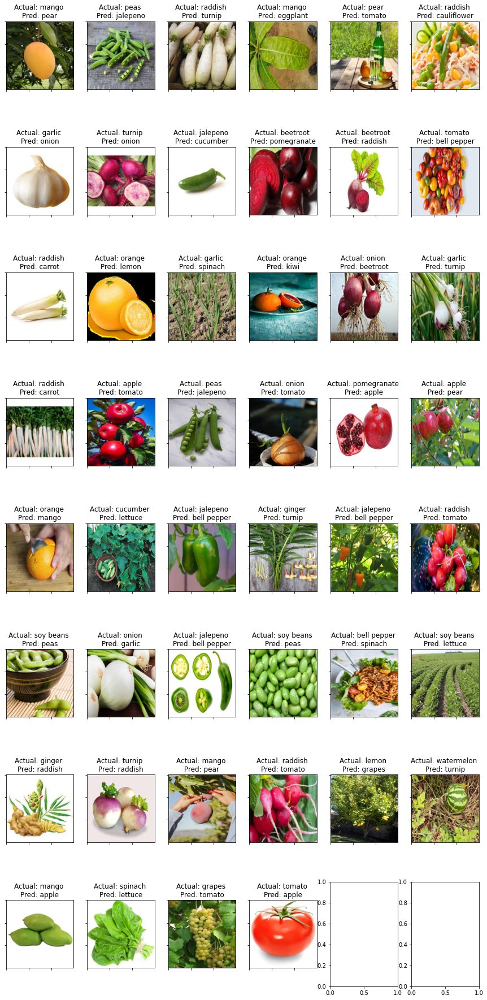

time: 5.42 s (started: 2022-08-05 10:17:59 -07:00)


In [41]:
# All Features including resnet
feature_list = used_feature_names

base_model = KNeighborsClassifier(n_neighbors=len(labels_used))
acc,f1,val_pred = run_model_for_features(base_model, "Base All Feature KNN",feature_list=feature_list)

if f1 > .33:
    display_failures(val_images,val_labels,val_pred )

if (f1 > best_f1):
    best_f1 = f1
    best_model = base_model
    best_features_to_use = feature_list
    best_model_name = "Base KNN"

 Processing feature Color Features
Base KNN only Color Features validation set accuracy score:    11.508
Base KNN only Color Features validation set f1 score:    13.359


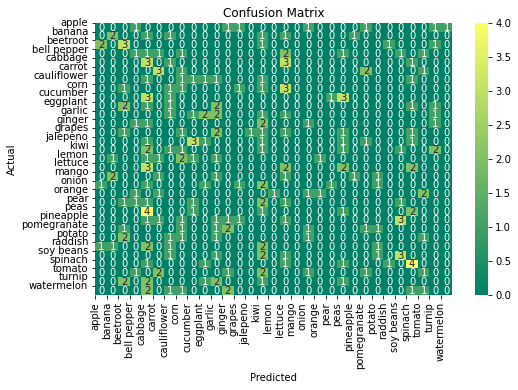

 Processing feature FFT Features
Base KNN only FFT Features validation set accuracy score:     17.46
Base KNN only FFT Features validation set f1 score:    19.935


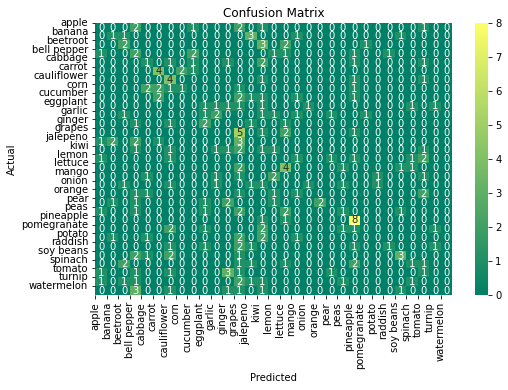

 Processing feature Resnet Features
Base KNN only Resnet Features validation set accuracy score:    79.762
Base KNN only Resnet Features validation set f1 score:    80.215


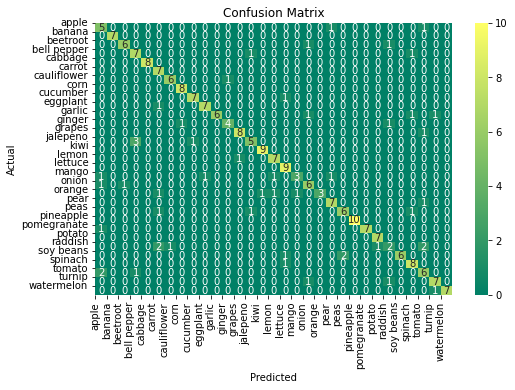

51 images were misclassifed


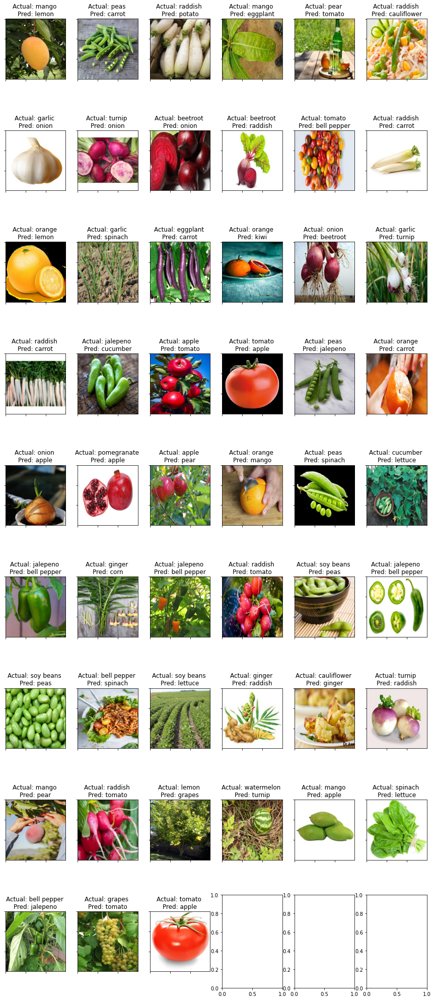

time: 9.84 s (started: 2022-08-05 10:18:05 -07:00)


In [42]:
# iterate over all feature except resnet
for f in used_feature_names:
    print (f" Processing feature {f}")
    base_model = KNeighborsClassifier(n_neighbors=len(labels_used))
    acc,f1,val_pred = run_model_for_features(base_model, f"Base KNN only {f}",feature_list=[f])

    if f1 > .5:
        display_failures(val_images,val_labels,val_pred )
    if (f1 > best_f1):
        best_f1 = f1
        best_model = base_model
        best_features_to_use = [f]
        best_model_name = f"Base KNN only {f}"

### 8a: Model Limitations

KNN is limited by how linearly separable the data is, in our data it is effective, but not optimal.

## Step 9: SVM training

SVM models are often well suited to CV problems, so we tried our features with that model.  First with a model with default parameters (C = 1, with an RBF kernel), then with a grid search for optimum parameters. We tried each feature set individually, and also as a group. First with just our manually created features, and then with the ResNet features, and then all combined. Both of the color and FFT feature sets are able to do far better than random guessing, (F-1 scores of 19.122% and 23.448% respectively) combined they were only able to get a score of 30.961%.  Whereas the ResNet features on their own were almost perfect with a score of 90.065%, which actually decreased slightly (to 89.189%) when we merged the ResNet features with the manually generated features.

The only images that the ResNet+SVM model did not correctly predict are ones that are very niche representations of the category in question, and we do not believe that it is likely to find a model that can outperform on this data set.

The default parameters for SVC:
 - C=1, 
 - kernel='rbf', 
 - gamma=1/(n_features * X.var())

Base SVM only Color Features validation set accuracy score:     17.46
Base SVM only Color Features validation set f1 score:    19.122


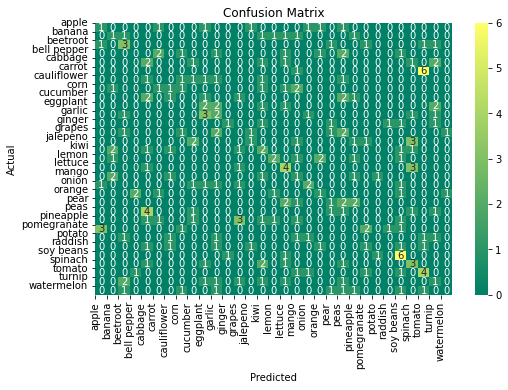

Base SVM only FFT Features validation set accuracy score:    20.635
Base SVM only FFT Features validation set f1 score:    23.448


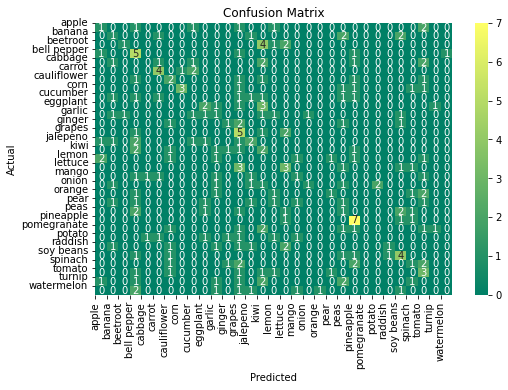

Base SVM only Resnet Features validation set accuracy score:    90.079
Base SVM only Resnet Features validation set f1 score:    90.065


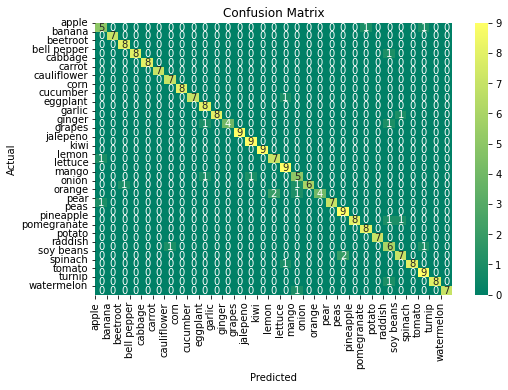

25 images were misclassifed
Color + FFT SVM model validation set accuracy score:    29.365
Color + FFT SVM model validation set f1 score:    30.961


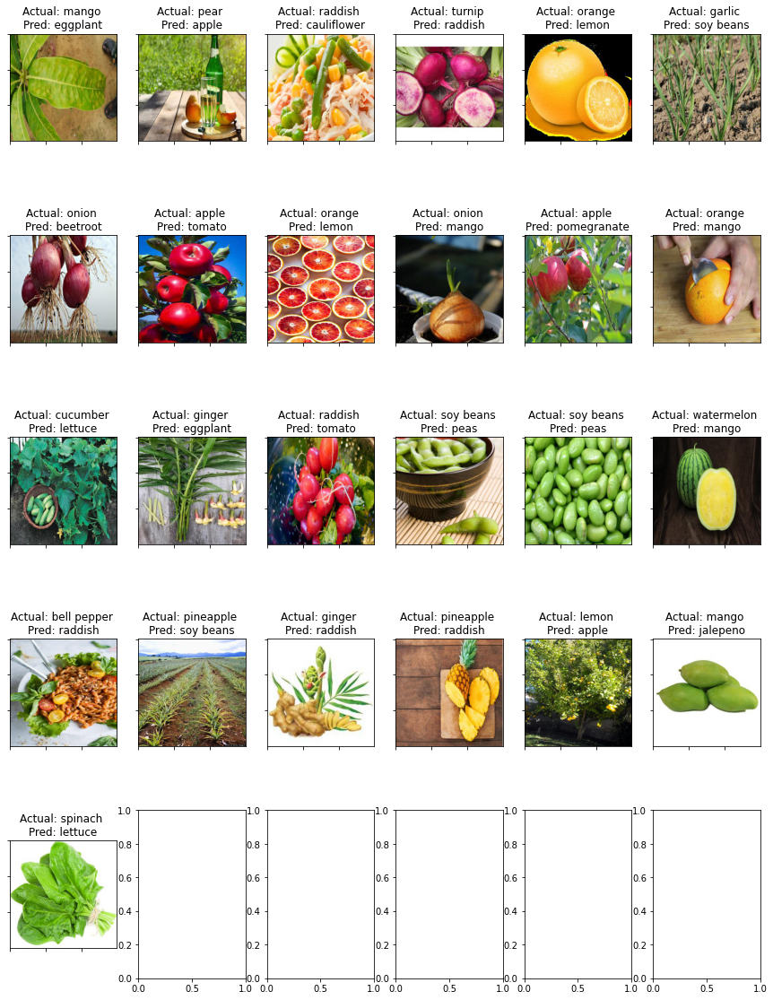

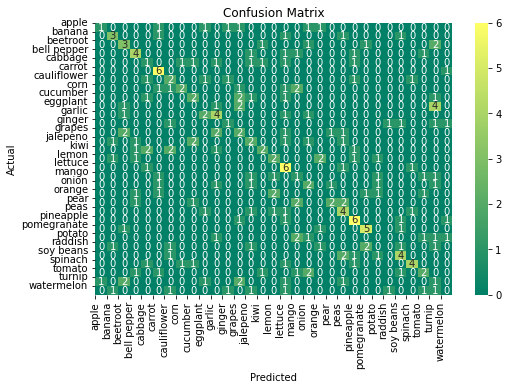

time: 13.5 s (started: 2022-08-05 10:18:14 -07:00)


In [43]:
# iterate over all feature sets to see how they do on their own

for f in used_feature_names:

    base_model = svm.SVC()
    acc,f1,val_pred = run_model_for_features(base_model, f"Base SVM only {f}",feature_list=[f])

    if (f1 > best_f1):
        display_failures(val_images,val_labels,val_pred)
        best_f1 = f1
        best_model = base_model
        best_features_to_use = [f]
        best_model_name = f"Base SVM only {f}"
        
# color and fft do best, so try them together
base_model = svm.SVC()
acc,f1,val_pred = run_model_for_features(base_model, f"Color + FFT SVM model",feature_list=["Color Features","FFT Features"])

if (f1 >= best_f1):
    display_failures(val_images,val_labels,val_pred)
if (f1 > best_f1):
    display_failures(val_images,val_labels,val_pred)
    best_f1 = f1
    best_model = base_model
    best_features_to_use = ["Color Features","FFT Features"]
    best_model_name = "Color + FFT SVM model"

Base Manual Features SVM validation set accuracy score:    29.365
Base Manual Features SVM validation set f1 score:    30.961


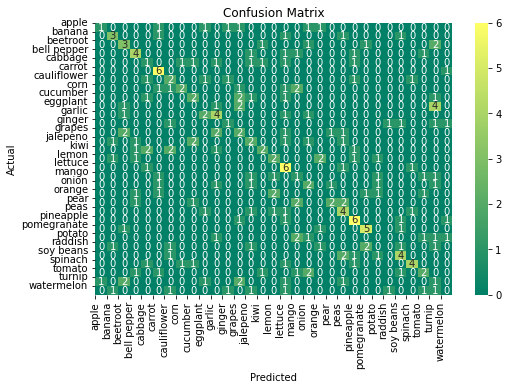

Base All Features SVM validation set accuracy score:    89.286
Base All Features SVM validation set f1 score:    89.189


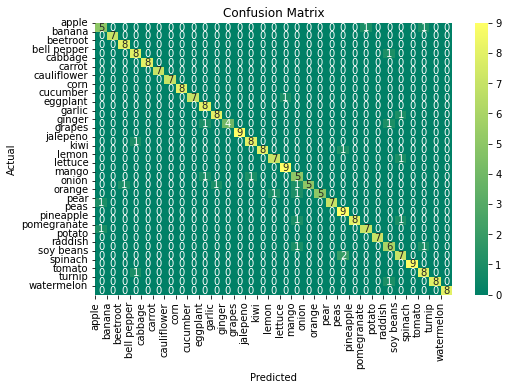

time: 7 s (started: 2022-08-05 10:18:28 -07:00)


In [44]:
# All Manual Features
feature_list = used_feature_names[:-1]

base_model = svm.SVC()
acc,f1,test_pred = run_model_for_features(base_model, "Base Manual Features SVM",feature_list = feature_list)

if (f1 > best_f1):
    display_failures(val_images,val_labels,val_pred)
    best_f1 = f1
    best_model = base_model
    best_features_to_use = feature_list
    best_model_name = "Base SVM"

# All Features
feature_list = used_feature_names

base_model = svm.SVC()
acc,f1,val_pred = run_model_for_features(base_model, "Base All Features SVM",feature_list = feature_list)

if (f1 >= best_f1):
    display_failures(val_images,val_labels,val_pred)
if (f1 > best_f1):
    best_f1 = f1
    best_model = base_model
    best_features_to_use = feature_list
    best_model_name = "Base All Features SVM"

### 9a: Model Limitations

SVM performs better than KNN in that it is able to differentiate between non linearly separable data.  It has a weakness in processing large data sets, however our data set is not overly large. SVM was our best performing model, when run with the ResNet output features.

## Step 10: CNN training

As we have achieved great results from SVM model with principal components and ResNet extracted feature embedding, we would like to test it with CNN model as it is often the state-of-arts-model and has more flexible architecture. Given that our features are PCA components and learned ResNet features in a 1D array, we designed a shallow network which has two fully-connected dense layers with ReLU activation function, and one classification layer with softmax function to predict its class. Like the models in the previous section, we trained the CNN on different combinations of image features. For PCA reduced manual features, this model was able to achieve 21.02% accuracy and 2.9856 loss in the train set and 19.05% accuracy and 2.9873 loss in the validation set. For PCA reduced manual features and ResNet extracted features, this model was able to achieve 79.08% accuracy and 0.7710 loss in the train set and 83.33% accuracy and 0.7229 loss in the validation set. The CNN with PCA reduced ResNet extracted features had 83.333% validation accuracy and 83.562 validation F1 score..

In [45]:
# Model Architecture
def cnn_model(input_len, num_cat):
  model = Sequential()
  model.add(Flatten(input_shape=(input_len,)))
  model.add(Dense(128, activation="relu"))
  model.add(Dropout(0.2))
  model.add(Dense(64, activation="relu"))
  model.add(Dropout(0.2))
  model.add(Dense(num_cat, kernel_initializer='uniform', activation="softmax"))
  
  model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['acc'])

  return model


time: 0 ns (started: 2022-08-05 10:18:35 -07:00)


In [46]:
num_cat = len(labels_used)

# one hot encoded the labels
train_lbs = tf.one_hot(train_labels, num_cat)
test_lbs = tf.one_hot(test_labels, num_cat)
val_lbs = tf.one_hot(val_labels, num_cat)

time: 16 ms (started: 2022-08-05 10:18:35 -07:00)


### 10a: CNN with PCA reduced hand-crafted features

In [47]:
# convert features to tensor and use type float64
train_pca_tensor = tf.convert_to_tensor(flatten_arr(train_pca))
test_pca_tensor= tf.convert_to_tensor(flatten_arr(test_pca))
validation_pca_tensor = tf.convert_to_tensor(flatten_arr(val_pca)) 

time: 16 ms (started: 2022-08-05 10:18:35 -07:00)


In [48]:
input_len = train_pca_tensor[0].shape[0]
cnn_pca = cnn_model(input_len, num_cat)
cnn_pca.fit(x=train_pca_tensor, y=train_lbs, validation_data=(validation_pca_tensor, val_lbs), epochs=20)

Epoch 1/20
63/63 [==============================] - 1s 3ms/step - loss: 3.4335 - acc: 0.0372 - val_loss: 3.4264 - val_acc: 0.0317
Epoch 2/20
63/63 [==============================] - 0s 2ms/step - loss: 3.4249 - acc: 0.0387 - val_loss: 3.4204 - val_acc: 0.0317
Epoch 3/20
63/63 [==============================] - 0s 1ms/step - loss: 3.4158 - acc: 0.0571 - val_loss: 3.4137 - val_acc: 0.0437
Epoch 4/20
63/63 [==============================] - 0s 1ms/step - loss: 3.4091 - acc: 0.0635 - val_loss: 3.4066 - val_acc: 0.0516
Epoch 5/20
63/63 [==============================] - 0s 2ms/step - loss: 3.3993 - acc: 0.0774 - val_loss: 3.3985 - val_acc: 0.0675
Epoch 6/20
63/63 [==============================] - 0s 1ms/step - loss: 3.3904 - acc: 0.0794 - val_loss: 3.3891 - val_acc: 0.0675
Epoch 7/20
63/63 [==============================] - 0s 2ms/step - loss: 3.3767 - acc: 0.0854 - val_loss: 3.3778 - val_acc: 0.0675
Epoch 8/20
63/63 [==============================] - 0s 1ms/step - loss: 3.3654 - acc: 0.09

time: 2.75 s (started: 2022-08-05 10:18:35 -07:00)


In [49]:
model_name = 'cnn_pca'
preds = np.argmax(cnn_pca.predict(validation_pca_tensor), axis=-1)
acc = accuracy_score(preds,val_labels)
print(f'{model_name} validation set accuracy score: {acc*100:9.5}')
f1 = f1_score(preds,val_labels,average="weighted")
print(f'{model_name} validation set f1 score: {f1*100:9.5}')

if (f1 >= best_f1):
    display_failures(val_images,val_labels, preds)
if (f1 > best_f1):
    best_f1 = f1
    best_model = cnn_pca
    best_features_to_use = "PCA"
    best_model_name = "CNN_wPCA"

cnn_pca validation set accuracy score:    23.413
cnn_pca validation set f1 score:    28.415
time: 110 ms (started: 2022-08-05 10:18:38 -07:00)


### 10b: CNN with PCA reduced hand-crafted features and ResNet extracted features

In [50]:
# convert features to tensor and use type float64
train_ft_tensor = tf.convert_to_tensor(flatten_arr(train_ft))
test_ft_tensor= tf.convert_to_tensor(flatten_arr(test_ft))
validation_ft_tensor = tf.convert_to_tensor(flatten_arr(val_ft)) 

time: 219 ms (started: 2022-08-05 10:18:38 -07:00)


In [51]:
input_len = train_ft_tensor[0].shape[0]
cnn_pca_rn = cnn_model(input_len, num_cat)
cnn_pca_rn.fit(x=train_ft_tensor, y=train_lbs, validation_data=(validation_ft_tensor, val_lbs), epochs=20)

Epoch 1/20
63/63 [==============================] - 0s 4ms/step - loss: 3.3854 - acc: 0.0734 - val_loss: 3.3244 - val_acc: 0.1270
Epoch 2/20
63/63 [==============================] - 0s 2ms/step - loss: 3.2542 - acc: 0.1434 - val_loss: 3.1537 - val_acc: 0.2500
Epoch 3/20
63/63 [==============================] - 0s 3ms/step - loss: 3.0523 - acc: 0.2551 - val_loss: 2.9035 - val_acc: 0.4087
Epoch 4/20
63/63 [==============================] - 0s 3ms/step - loss: 2.7822 - acc: 0.3558 - val_loss: 2.5905 - val_acc: 0.5198
Epoch 5/20
63/63 [==============================] - 0s 3ms/step - loss: 2.4919 - acc: 0.4283 - val_loss: 2.2705 - val_acc: 0.6310
Epoch 6/20
63/63 [==============================] - 0s 2ms/step - loss: 2.2027 - acc: 0.4804 - val_loss: 1.9793 - val_acc: 0.6508
Epoch 7/20
63/63 [==============================] - 0s 3ms/step - loss: 1.9417 - acc: 0.5454 - val_loss: 1.7465 - val_acc: 0.6825
Epoch 8/20
63/63 [==============================] - 0s 3ms/step - loss: 1.7653 - acc: 0.57

time: 3.72 s (started: 2022-08-05 10:18:38 -07:00)


Best Fit Model f1score :     82.41


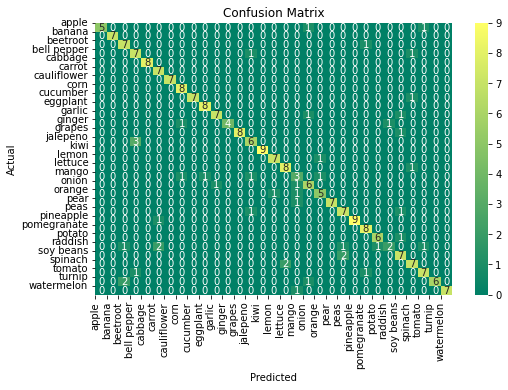

time: 1.81 s (started: 2022-08-05 10:18:42 -07:00)


In [52]:
preds = np.argmax(cnn_pca_rn.predict(validation_ft_tensor), axis=-1)

print(f'CNN with PCA f1 score : {f1_score(preds,val_labels,average="weighted")*100:9.5}')
plot_confusion(val_labels,preds)

In [53]:
model_name = 'CNN with PCA and ResNet'
acc = accuracy_score(preds,val_labels)
print(f'{model_name} validation set accuracy score: {acc*100:9.5}')
f1 = f1_score(preds,val_labels,average="weighted")
print(f'{model_name} validation set f1 score: {f1*100:9.5}')

if (f1 >= best_f1):
    display_failures(val_images,val_labels, preds)
if (f1 > best_f1):
    best_f1 = f1
    best_model = cnn_pca_rn
    best_features_to_use = "PCA and ResNet"
    best_model_name = "CNN_wPCA_RN"

cnn with PCA and ResNet validation set accuracy score:    82.143
cnn with PCA and ResNet validation set f1 score:     82.41
time: 0 ns (started: 2022-08-05 10:18:44 -07:00)


### 10c: Model Limitations

Compared to SVM, CNN can process large datasets but can be computationally expensive even if leveraging GPU units. Neutral networks is also known for its low interpretability, even though it has given comparable accuracy to SVM. But both the ResNet features and PCA values also have low interpretability in terms of features represented. 

## Step 11: Check against test set

Over all of our models, the most successful was the SVM model using the ResNet features.  On our validation set it found an accuracy score of 90.079% and F1 score of 90.065%. We took this model and ran it against our held out test set. If our model were overfitting we would expect the F1 results to be lower than for our validation set, however we find a comparable accuracy score of 91.667% and F1 score of 91.633%. From this we conclude that our SVM model was well trained, but not overtrained to the dataset.  

Looking at the images on which the model was inaccurate most are ones where a human could be confused as well. Many include showing the item in other contexts or growth phases from the dominant presentation of the category (e.g. the stalks of young *corn* plants, sliced *banana*, or cooked *potato*). There is only one pair (*lettuce* and *spinach*) where the categories are confused more than once, which may reflect that both vegetables change shape through their growth cycle, and there may be more variance amid a category as there is between categories.

Best performing model overall: Base SVM only Resnet Features
Best overall f1:    90.065
Best overall features: ['Resnet Features']
Base SVM only Resnet Features test set accuracy score:    91.667
Base SVM only Resnet Features test set f1 score:    91.633


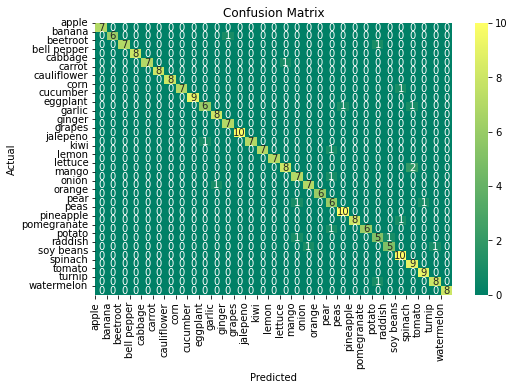

21 images were misclassifed


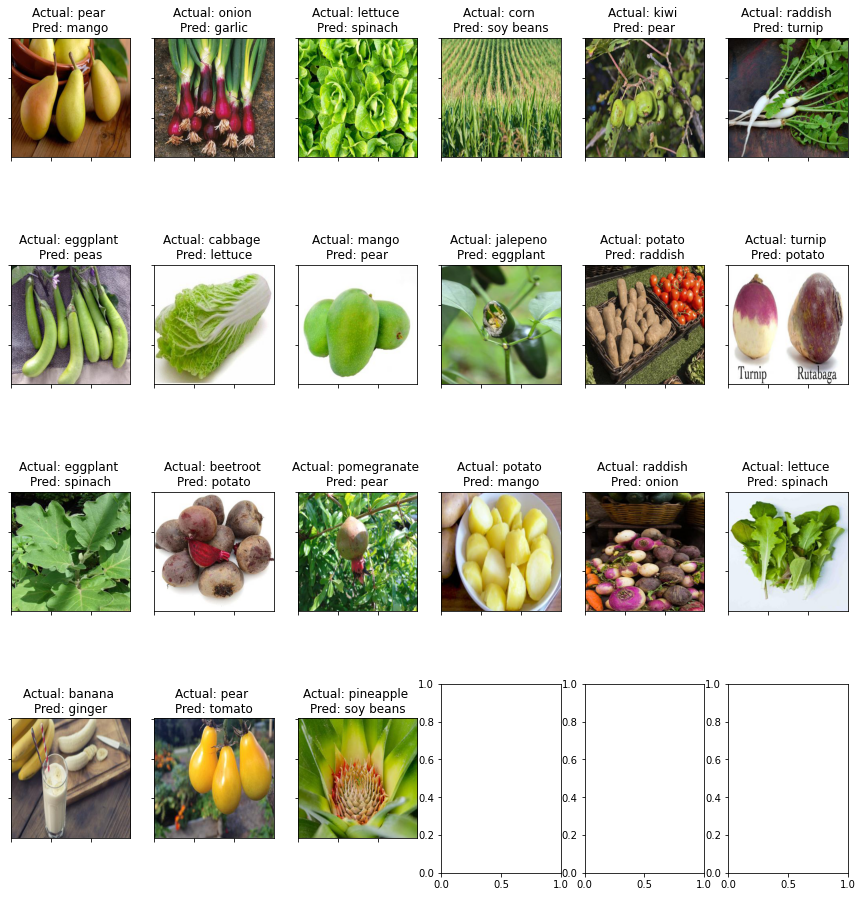

time: 19.5 s (started: 2022-08-05 21:12:51 -07:00)


In [55]:
# check best prior model against held out data.
# the held out set is: test

print(f"Best performing model overall: {best_model_name}")
print(f"Best overall f1: {best_f1*100:9.5}")
print(f"Best overall features: {best_features_to_use}")

use_as_final_test_pca = test_pca
use_as_final_test_labels = test_labels
use_as_final_test_images = test_images
use_as_final_test_embeddings = test_embeddings


if best_model_name == "CNN_wPCA_RN":
  test_input = test_ft_tensor
  test_pred = np.argmax(best_model.predict(test_input), axis=-1)  
elif best_model_name ==  "CNN_wPCA":
  test_input = test_pca_tensor 
  test_pred = np.argmax(best_model.predict(test_input), axis=-1)
else:
  test_input = build_input_feature_set(use_as_final_test_pca,use_as_final_test_embeddings,best_features_to_use)
  test_pred = best_model.predict(test_input)
    
acc = accuracy_score(test_pred,use_as_final_test_labels)
print(f'{best_model_name} test set accuracy score: {acc*100:9.5}')
f1 = f1_score(test_pred,use_as_final_test_labels,average="weighted")
print(f'{best_model_name} test set f1 score: {f1*100:9.5}')
# plot the confusion matrix
plot_confusion(use_as_final_test_labels,test_pred)

display_failures(use_as_final_test_images,use_as_final_test_labels,test_pred )

# Summary and Conclusions

Classifying fruits and vegetables was a more difficult task than we expected. From the onset, we ran into unanticipated issues that included different file formats, duplicate images within labels, largely similar images across labels, and different image resolutions. After adjusting for these issues, we were surprised by the lack of explainability in our original feature selection, notably HOG and LBP. We explored other methods for image segmentation beyond Kmeans color segmentation, but encountered roadblocks related to a large portion of images having a white background vs. a large portion of images having a natural background. A separate issue was that some images had a single unit of the fruit or vegetable and other images had multiple units of the fruit or vegetable. These complexities led to relatively poor performance in our initial models.

By and large, we were pleased by the performance of our final model. The ResNet feature set has a strong representation of our images, and we achieved 91.667% final test accuracy with ResNet features alone with SVM. With the addition of hand-crafted features, we were able to achieve 89.286% validation accuracy. It is apparent that the ResNet feature set plays a critical role to strengthen the predictivity of our model. ResNet’s pretrained weights come from training on a dataset of images much larger and robust than our own, so this is unsurprising. In addition, the sheer number of 2048 ResNet features obtained, which outnumbered the hand-crafted features by at least 13 fold, helped to improve the performance of the model.

Another learning from this project was how accurate the simpler (e.g. KNN and SVM) models were able to be with the right feature set, compared to the CNN model. Many people reflexively start with a complicated CNN model; however, for many projects, this may not be necessary for model accuracy, and may reduce interpretability of the results. In our case, we needed the ResNet features, which reduced interpretability in exchange for accuracy; however, with more work in other manual features we might have been able to get enough resolution to use a simpler set.

Below are summary tables of how all of our models performed against the validation data set. Some models were not run due to time and/or model constraints.

#### 31 Category KNN Validation Set Accuracy and F1 Scores by Best Performing Feature Combination

|          | KNN Color Features Only | KNN FFT Only | KNN ResNet only | KNN Color + FFT | KNN Color + FFT + ResNet |
|----------|-------------------------|--------------|-----------------|-----------------|--------------------------|
| Accuracy |                  11.508 |        17.46 |          79.762 |                 |                   81.746 |
| F1       |                  13.359 |       19.935 |          80.215 |                 |                   82.251 |

#### 31 Category SVM Validation Set Accuracy and F1 Scores by Best Performing Feature Combination

|          | SVM Color Features Only | SVM FFT Only | SVM ResNet only | SVM Color + FFT | SVM Color + FFT + ResNet |
|----------|-------------------------|--------------|-----------------|-----------------|--------------------------|
| Accuracy |                   17.46 |       20.635 |          90.079 |          29.365 |                   89.286 |
| F1       |                  19.122 |       23.448 |          90.065 |          30.961 |                   89.189 |

#### 31 Category CNN Validation Set Accuracy Scores by Best Performing Feature Combination

|          | CNN Color Features Only | CNN FFT Only | CNN ResNet only | CNN Color + FFT | CNN Color + FFT + ResNet |
|----------|-------------------------|--------------|-----------------|-----------------|--------------------------|
| Accuracy |                   19.05 |              |          83.333 |                 |                    83.33 |
| F1       |                         |              |          83.562 |                 |                          |

# Appendix

Image counts by categories.  Highlighted categories were low quality, and were not used in our analysis.

| Label         | Count | Label       | Count |
|---------------|-------|-------------|-------|
| apple         | 78    | lettuce     | 106   |
| banana        | 84    | mango       | 96    |
| beetroot      | 98    | onion       | 104   |
| bell pepper   | 99    | orange      | 78    |
| cabbage       | 91    | **paprika**     | 93    |
| **capsicum**     | 89    | pear        | 99    |
| carrot        | 96    | peas        | 110   |
| cauliflower   | 97    | pineapple   | 109   |
| **chilli pepper** | 96    | pomegranate | 89    |
| corn          | 97    | potato      | 87    |
| cucumber      | 104   | raddish     | 90    |
| eggplant      | 94     | soy beans   | 107   |
| garlic        | 102   | spinach     | 107   |
| ginger        | 78    | **sweetcorn**   | 101   |
| grapes        | 109   | **sweetpotato** | 79    |
| jalepeño      | 97    | tomato      | 102   |
| kiwi          | 98    | turnip      | 108   |
| lemon         | 92    | watermelon  | 94    |